# Importing Libs

In [1]:
import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
import os
from mpl_toolkits import mplot3d
from plotly.offline import download_plotlyjs, init_notebook_mode
from plotly.offline import plot, iplot
import plotly.graph_objects as go

# Importing the sclaed set

In [2]:
path=r"C:\Users\Sam\Desktop\CF\Machine Learning\Achievment 1\DataSets"
data=pd.read_pickle(os.path.join(path,"data_scaled.pkl"))

In [3]:
#checking for execution
data.head(3)

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,19600101,1,0.660514,-0.02793,0.826097,-0.001949,-1.101066,-0.265148,-0.179228,-0.902918,...,-0.443701,0.761754,-1.299744,-0.806427,-0.088407,-0.024706,0.372147,-0.668215,-0.519743,-0.752237
1,19600102,1,0.244897,-0.02793,0.735760,-0.001949,-1.058108,1.658760,-0.179228,-0.810126,...,0.783085,1.183580,-1.262455,-1.042055,0.503361,-0.024706,-0.829285,-0.548046,-0.629054,-0.407141
2,19600103,1,1.076130,-0.02793,1.277781,-0.001949,-1.251420,0.155707,-0.179228,-1.065304,...,0.783085,1.183580,-0.432779,-1.136306,-0.396127,-0.024706,-1.009500,-0.067372,0.054135,-0.177078


### Reducing to just mean temps and selecting the year to analyze 1999

In [4]:
# Reducing to just the mean temperatures
data_reduced= data[['DATE', 'MONTH','BASEL_temp_mean',
 'BELGRADE_temp_mean',
 'BUDAPEST_temp_mean',
 'DEBILT_temp_mean',
 'DUSSELDORF_temp_mean',
 'GDANSK_temp_mean',
 'HEATHROW_temp_mean',
 'KASSEL_temp_mean',
 'LJUBLJANA_temp_mean',
 'MAASTRICHT_temp_mean',
 'MADRID_temp_mean',
 'MUNCHENB_temp_mean',
 'OSLO_temp_mean',
 'ROMA_temp_mean',
 'SONNBLICK_temp_mean',
 'STOCKHOLM_temp_mean',
 'TOURS_temp_mean',
 'VALENTIA_temp_mean']].copy()

In [5]:
# checking for execution
data_reduced.head()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
0,19600101,1,-0.528623,-1.016876,-1.099163,-0.114356,-0.105836,-0.927601,-0.106469,-0.182904,-1.370824,-0.097084,-0.988280,-0.265742,-0.186575,-1.280450,-0.124331,-0.391072,-0.257321,-0.668215
1,19600102,1,-0.582946,-1.107669,-1.110927,-0.367511,-0.370915,-0.825294,-0.892676,-0.212437,-1.043881,-0.232112,-0.691740,-0.353714,-0.368598,-0.539569,-0.650834,-0.415953,-0.335759,-0.548046
2,19600103,1,-0.257010,-1.084971,-1.063873,-0.509912,-0.532908,-0.940389,-0.490837,-0.389635,-0.741156,-0.487164,-0.853490,-0.403983,-0.550620,-0.876333,-0.650834,-0.615003,-0.210258,-0.067372
3,19600104,1,-0.555784,-1.209812,-1.146217,-0.525734,-0.577088,-1.042696,-0.316124,-0.493001,-0.910682,-0.472161,-0.624345,-0.642763,-0.417137,-0.775304,-0.943336,-0.764290,-0.069069,-0.998679
4,19600105,1,-1.003946,-1.209812,-1.087400,-0.320045,-0.444548,-0.978754,-0.403481,-0.552067,-0.862246,-0.307127,-0.381721,-0.906678,-0.332193,-0.926848,-0.621584,-0.503037,-0.037694,-1.509396


In [6]:
data_reduced

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
0,19600101,1,-0.528623,-1.016876,-1.099163,-0.114356,-0.105836,-0.927601,-0.106469,-0.182904,-1.370824,-0.097084,-0.988280,-0.265742,-0.186575,-1.280450,-0.124331,-0.391072,-0.257321,-0.668215
1,19600102,1,-0.582946,-1.107669,-1.110927,-0.367511,-0.370915,-0.825294,-0.892676,-0.212437,-1.043881,-0.232112,-0.691740,-0.353714,-0.368598,-0.539569,-0.650834,-0.415953,-0.335759,-0.548046
2,19600103,1,-0.257010,-1.084971,-1.063873,-0.509912,-0.532908,-0.940389,-0.490837,-0.389635,-0.741156,-0.487164,-0.853490,-0.403983,-0.550620,-0.876333,-0.650834,-0.615003,-0.210258,-0.067372
3,19600104,1,-0.555784,-1.209812,-1.146217,-0.525734,-0.577088,-1.042696,-0.316124,-0.493001,-0.910682,-0.472161,-0.624345,-0.642763,-0.417137,-0.775304,-0.943336,-0.764290,-0.069069,-0.998679
4,19600105,1,-1.003946,-1.209812,-1.087400,-0.320045,-0.444548,-0.978754,-0.403481,-0.552067,-0.862246,-0.307127,-0.381721,-0.906678,-0.332193,-0.926848,-0.621584,-0.503037,-0.037694,-1.509396
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,10,0.747959,0.628750,-0.005167,0.898267,1.042841,0.440753,0.906865,-0.005705,0.481853,1.268193,0.683127,0.664244,0.395898,-0.000746,0.826301,0.517090,1.295755,-0.007287
22946,20221028,10,0.856604,0.367720,-0.005167,0.945734,1.278467,0.466330,0.802037,-0.005705,0.263891,1.313202,0.561815,0.890456,0.541516,-0.000746,1.074927,0.641496,1.358505,-0.007287
22947,20221029,10,0.856604,0.083991,-0.005167,0.914089,1.101748,0.786039,0.924336,-0.005705,0.300218,1.208181,0.548336,1.053832,0.395898,-0.000746,1.221178,0.716139,1.405568,-0.007287
22948,20221030,10,0.680055,0.265577,-0.005167,0.692578,0.880848,0.376811,0.697210,-0.005705,0.397090,0.923123,0.103526,0.689378,-0.065226,-0.000746,1.235803,0.019467,0.668249,-0.007287


In [7]:
# reducing to year 1999
data_year=data_reduced[data_reduced["DATE"].astype(str).str.contains("1999")]

In [8]:
data_year

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
14245,19990101,1,-1.370624,-1.425445,-1.746150,-0.668134,-0.753808,-1.260098,-0.351067,-1.260860,-1.286061,-0.352136,-1.338737,-1.183161,-0.744778,-0.657436,-0.723959,-0.851374,-0.665199,-0.848468
14246,19990102,1,-1.031107,-1.005527,-1.522646,-0.573200,-0.665448,-1.515865,-0.508308,-0.995063,-1.164971,-0.442155,-1.527444,-0.994650,-0.720508,-0.657436,-0.533833,-0.776730,-0.586761,-0.848468
14247,19990103,1,-0.352074,-1.028225,-1.040346,-0.699778,-0.709628,-1.247310,-0.420952,-0.699732,-0.995445,-0.622191,-1.419611,-0.253175,-0.502081,-1.061553,-0.636209,-0.627443,-0.414197,-0.487962
14248,19990104,1,-0.161945,-1.277907,-0.922712,0.012222,-0.032203,-1.119426,-0.228768,-0.153371,-1.007554,0.067949,-1.500486,-0.026962,-0.562755,-1.128906,-0.402207,-0.652324,-0.100445,-0.217583
14249,19990105,1,-0.094042,-0.926083,-1.110927,0.233733,0.218150,-0.224241,0.208014,0.186260,-1.237625,0.353007,-0.934364,-0.202905,-0.732643,-1.044715,0.329047,-0.577681,-0.053382,-0.638173
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14605,19991227,12,-0.732333,-0.971480,-0.910949,-0.984579,-1.121973,-1.145003,-1.399343,-1.127962,-0.959118,-1.042277,-0.476075,-0.856409,-0.696239,-0.303834,-1.352838,-0.789171,-0.790700,-1.779775
14606,19991228,12,-1.085430,-0.903385,-1.310904,-1.348490,-1.195607,-0.965966,-1.364400,-1.127962,-1.189189,-1.177304,-0.988280,-1.145458,-0.878261,-0.758466,-1.440589,-0.963339,-1.182891,-1.629564
14607,19991229,12,-1.166914,-1.209812,-1.193270,-1.079512,-1.166153,-1.311252,-1.608998,-1.039362,-1.540350,-1.177304,-1.554402,-1.183161,-1.205902,-1.768758,-1.923217,-1.174829,-1.386830,-1.088805
14608,19991230,12,-1.261978,-1.402747,-1.169744,-1.126979,-1.077794,-1.183368,-1.364400,-1.172261,-1.721985,-1.147298,-1.567881,-1.208295,-1.921859,-0.000746,-2.010968,-1.734655,-1.371143,-0.698257


(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18]),
 [Text(1, 0, 'BASEL_temp_mean'),
  Text(2, 0, 'BELGRADE_temp_mean'),
  Text(3, 0, 'BUDAPEST_temp_mean'),
  Text(4, 0, 'DEBILT_temp_mean'),
  Text(5, 0, 'DUSSELDORF_temp_mean'),
  Text(6, 0, 'GDANSK_temp_mean'),
  Text(7, 0, 'HEATHROW_temp_mean'),
  Text(8, 0, 'KASSEL_temp_mean'),
  Text(9, 0, 'LJUBLJANA_temp_mean'),
  Text(10, 0, 'MAASTRICHT_temp_mean'),
  Text(11, 0, 'MADRID_temp_mean'),
  Text(12, 0, 'MUNCHENB_temp_mean'),
  Text(13, 0, 'OSLO_temp_mean'),
  Text(14, 0, 'ROMA_temp_mean'),
  Text(15, 0, 'SONNBLICK_temp_mean'),
  Text(16, 0, 'STOCKHOLM_temp_mean'),
  Text(17, 0, 'TOURS_temp_mean'),
  Text(18, 0, 'VALENTIA_temp_mean')])

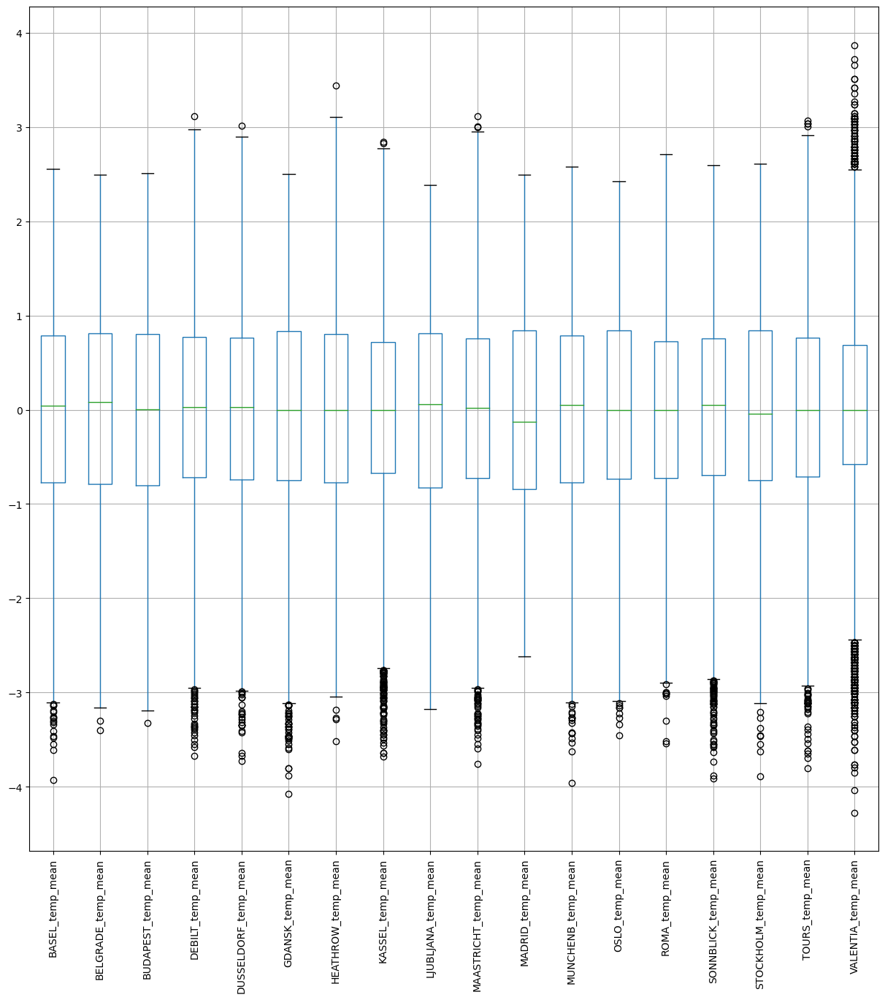

In [9]:
# dropping "DATE" and "MONTH" from the original set and looking at whisker plots
data_reduced_dropped=data_reduced.drop(["DATE","MONTH"],axis=1)
data_reduced_dropped.boxplot(figsize=(15,15))
plt.xticks(rotation=90)

In [12]:
# checking for execution
data_year_dropped.head()

,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
14245,-1.370624,-1.425445,-1.746150,-0.668134,-0.753808,-1.260098,-0.351067,-1.260860,-1.286061,-0.352136,-1.338737,-1.183161,-0.744778,-0.657436,-0.723959,-0.851374,-0.665199,-0.848468
14246,-1.031107,-1.005527,-1.522646,-0.573200,-0.665448,-1.515865,-0.508308,-0.995063,-1.164971,-0.442155,-1.527444,-0.994650,-0.720508,-0.657436,-0.533833,-0.776730,-0.586761,-0.848468
14247,-0.352074,-1.028225,-1.040346,-0.699778,-0.709628,-1.247310,-0.420952,-0.699732,-0.995445,-0.622191,-1.419611,-0.253175,-0.502081,-1.061553,-0.636209,-0.627443,-0.414197,-0.487962
14248,-0.161945,-1.277907,-0.922712,0.012222,-0.032203,-1.119426,-0.228768,-0.153371,-1.007554,0.067949,-1.500486,-0.026962,-0.562755,-1.128906,-0.402207,-0.652324,-0.100445,-0.217583
14249,-0.094042,-0.926083,-1.110927,0.233733,0.218150,-0.224241,0.208014,0.186260,-1.237625,0.353007,-0.934364,-0.202905,-0.732643,-1.044715,0.329047,-0.577681,-0.053382,-0.638173


In [13]:
# checking temps at all stations for 1999 where X-weather station, Y-day of the year, Z-temperature

fig = go.Figure(data=[go.Surface(z=data_year_dropped.values)])
fig.update_layout(title="Temp over time", autosize=False,
                  width=600, height=600)
fig.show()

In [14]:
# creating an index for the year 1999, had 365 days, scaling by 100
i=np.arange(0.01,3.66,0.01) 
index = pd.DataFrame(data=i, columns=["index"])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [15]:
rows=data_year.shape[0]

In [16]:
# checking for execution
rows

365

In [17]:
# translating chosen weather data into the X and Y datasets needed for the optimization function.
X=index.to_numpy().reshape(rows,1)
#Representing x_0 as a vector of 1s for vector computation
ones=np.ones((rows,1))
X=np.concatenate((ones, X), axis=1)
Y=data_year["BUDAPEST_temp_mean"].to_numpy().reshape(rows,1)

In [18]:
X.shape, Y.shape

((365, 2), (365, 1))

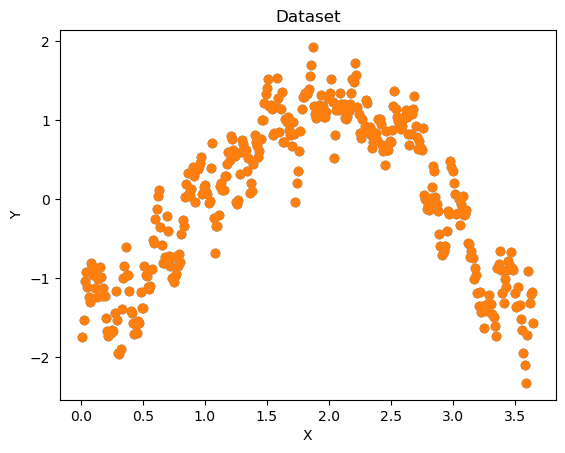

In [27]:
#looking at one year of temperature data over time for BUDAPEST
plt.scatter(x=index["index"], y=data_year['BUDAPEST_temp_mean']) 
plt.xlabel("X"); plt.ylabel("Y");
plt.title("Dataset");
plt.show()

In [20]:
#finding the min temp for BUDAPEST station for 1999
data_year['BUDAPEST_temp_mean'].min()

-2.3225571005157835

In [21]:
#finding the max temp for BUDAPEST station for 1999
data_year['BUDAPEST_temp_mean'].max()

1.9240314526846152

In [22]:
# computing the loss function for the gradiant descent where X-covariate matrix, y-prediction results, theta-loss

def compute_cost(X, y, theta=np.array([[0],[0]])):
    
    m = len(Y)
    J=0 # initialize loss to zero
    
    # reshaping theta
    theta=theta.reshape(2,1)
    
    # calculating the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtracting y from y_hat, square and sum
    error_term = sum((h_x - Y)**2)
    
    # divide by twice the number of samples 
    loss = error_term/(2*m)
    
    return loss

In [23]:
# checking
compute_cost(X,Y)

array([0.49778003])

In [24]:
# Gradient Descent function where Alpha is the learning rate
def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # updating theta
        term_vector = np.array([[term0],[term1]])
        #printing(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [32]:
%%time
#running the data through a gradiant descent for the starting conditions in 'theta_init.'
num_iterations=50 # per your suggestion starting at 50 iterations
theta_init=np.array([[1],[1]]) #guessing theta0 and theta1 at 1 and 1
alpha=0.1 #step size to try if not converged will try smaller stepps
theta, J_history, theta0_history, theta1_history = gradient_descent(X,Y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 62.5 ms
Wall time: 57.2 ms


In [33]:
theta

array([[0.02564141],
       [0.00895283]])

C:\Users\Sam\AppData\Local\Temp\ipykernel_46640\294946337.py:24: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



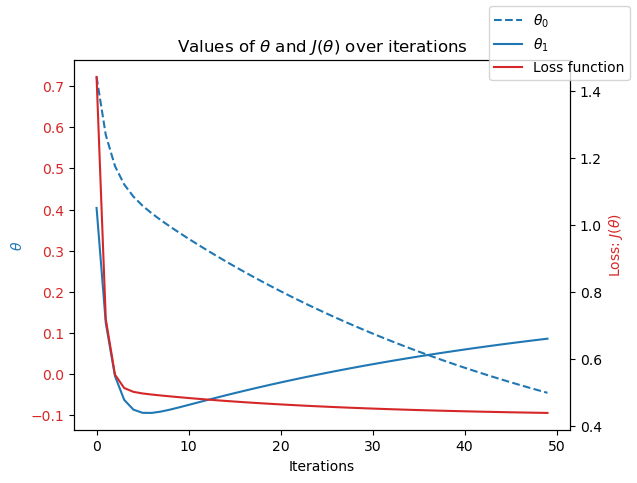

In [55]:
#making sure the plot gets displayed in the notebook
%matplotlib inline
#plotting the loss, theta0, and theta1. Red should be trnding towards 0
fig, ax1 = plt.subplots()

# plotting thetas over time
color="tab:blue"
ax1.plot(theta0_history, label="$\\theta_{0}$", linestyle="--", color=color)
ax1.plot(theta1_history, label="$\\theta_{1}$", linestyle="-", color=color)
# ax1.legend()
ax1.set_xlabel("Iterations"); ax1.set_ylabel("$\\theta$", color=color);
ax1.tick_params(axis="y", labelcolor=color)

# plotting loss function over time
color="tab:red"
ax2 = ax1.twinx()
ax2.plot(J_history, label="Loss function", color=color)
ax2.set_title("Values of $\\theta$ and $J(\\theta)$ over iterations")
ax2.set_ylabel("Loss: $J(\\theta)$", color=color)
ax1.tick_params(axis="y", labelcolor=color)

# ax2.legend();
fig.legend();
fig.show()

In [35]:
%%time
# theta ranges based on where thetas apperaed above
theta0_vals = np.linspace(-10.02564141,10,100) 
theta1_vals = np.linspace(-10,10.00895283,100) 
                                      
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

#computing cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, Y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitializing to 0

CPU times: total: 3.53 s
Wall time: 3.56 s


In [36]:
#getting a visual of the loss function where X-theta0, y-theta1, z-loss

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

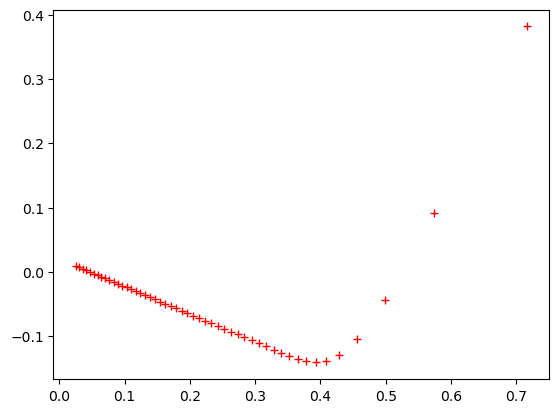

In [37]:
#getting a visual of the same loss function where X-theta0, y-theta1, z-loss with the line the loss function takes towards the min
#X-Theta0
#Y-Theta1
#Z-Loss
#black line-path of loss function over the iterations.
line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#adding a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [41]:
#Reruning the optimization above, but this time starting closer to the objective

num_iterations=50 #starting with the same number of itereations
theta_init=np.array([[-0.2],[0.2]]) #making a guess that is more accurate to the min
alpha= 0.1 #staring with the same step size
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,Y, theta_init,
                                                                   alpha, num_iterations)

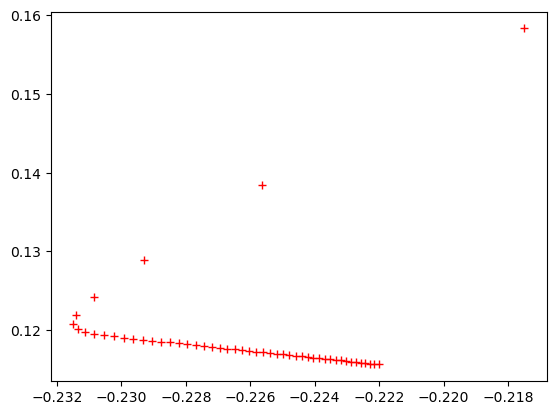

In [42]:
#looking at the new loss path on the function
line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#adding a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

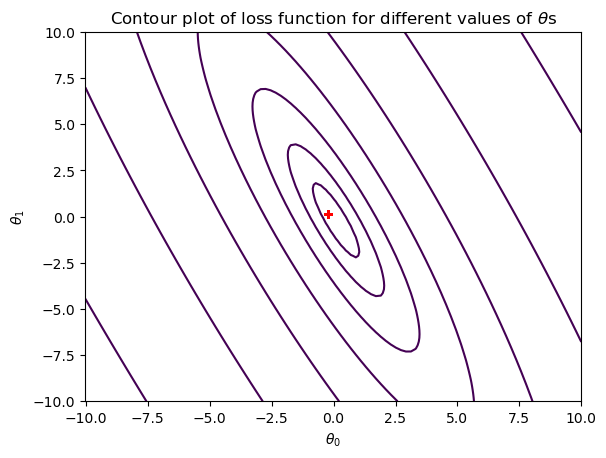

In [46]:
#showing the convergence similar to above, but without height
plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,25))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s");
plt.plot(theta0_history1, theta1_history1, 'r+');

# OSLO 1999

In [47]:
# translating chosen weather data into the X and Y datasets needed for the optimization function.
X=index.to_numpy().reshape(rows,1)
#Representing x_0 as a vector of 1s for vector computation
ones=np.ones((rows,1))
X=np.concatenate((ones, X), axis=1)
Y=data_year["OSLO_temp_mean"].to_numpy().reshape(rows,1)
X.shape, Y.shape

((365, 2), (365, 1))

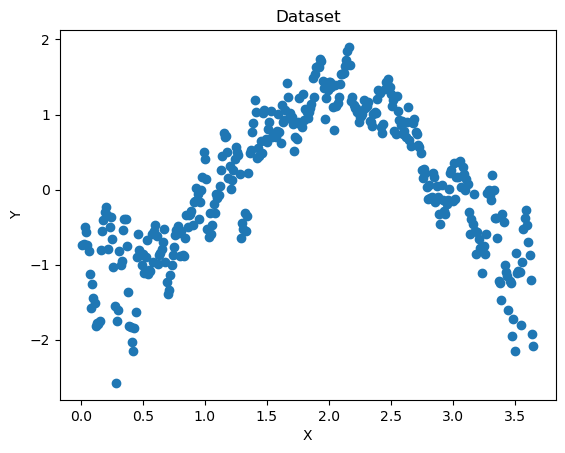

In [48]:
#looking at one year of temperature data over time for BUDAPEST
plt.scatter(x=index["index"], y=data_year['OSLO_temp_mean']) 
plt.xlabel("X"); plt.ylabel("Y");
plt.title("Dataset");
plt.show()

In [50]:
#finding the min temp for OSLO station for 1999
data_year['OSLO_temp_mean'].min()

-2.5771407308734524

In [51]:
#finding the max temp for OSLO station for 1999
data_year['OSLO_temp_mean'].max()

1.900619801870409

In [52]:
%%time
#running the data through a gradiant descent for the starting conditions in 'theta_init.'
num_iterations=50 # per your suggestion starting at 50 iterations
theta_init=np.array([[1],[1]]) #guessing theta0 and theta1 at 1 and 1
alpha=0.1 #step size to try if not converged will try smaller stepps
theta, J_history, theta0_history, theta1_history = gradient_descent(X,Y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 62.5 ms
Wall time: 60.2 ms


In [53]:
theta

array([[-0.0451496 ],
       [ 0.08636944]])

C:\Users\Sam\AppData\Local\Temp\ipykernel_46640\294946337.py:24: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



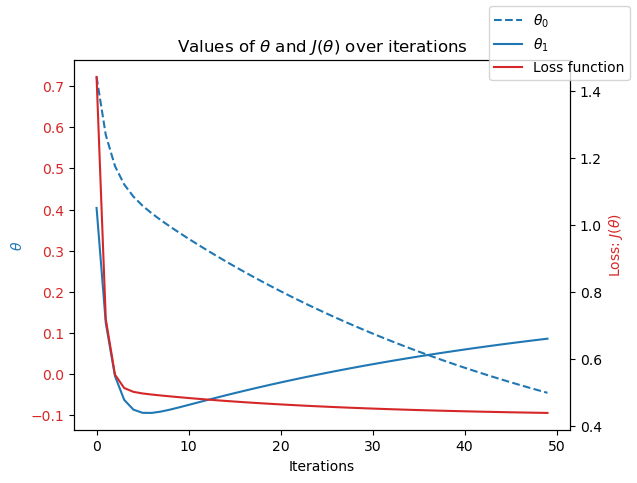

In [56]:
#making sure the plot gets displayed in the notebook
%matplotlib inline
#plotting the loss, theta0, and theta1. Red should be trnding towards 0
fig, ax1 = plt.subplots()

# plotting thetas over time
color="tab:blue"
ax1.plot(theta0_history, label="$\\theta_{0}$", linestyle="--", color=color)
ax1.plot(theta1_history, label="$\\theta_{1}$", linestyle="-", color=color)
# ax1.legend()
ax1.set_xlabel("Iterations"); ax1.set_ylabel("$\\theta$", color=color);
ax1.tick_params(axis="y", labelcolor=color)

# plotting loss function over time
color="tab:red"
ax2 = ax1.twinx()
ax2.plot(J_history, label="Loss function", color=color)
ax2.set_title("Values of $\\theta$ and $J(\\theta)$ over iterations")
ax2.set_ylabel("Loss: $J(\\theta)$", color=color)
ax1.tick_params(axis="y", labelcolor=color)

# ax2.legend();
fig.legend();
fig.show()

In [59]:
%%time
# theta ranges based on where thetas apperaed above
theta0_vals = np.linspace(-10.0451496,10,100) 
theta1_vals = np.linspace(-10,10.08636944,100) 
                                      
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

#computing cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, Y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitializing to 0

CPU times: total: 2.19 s
Wall time: 2.46 s


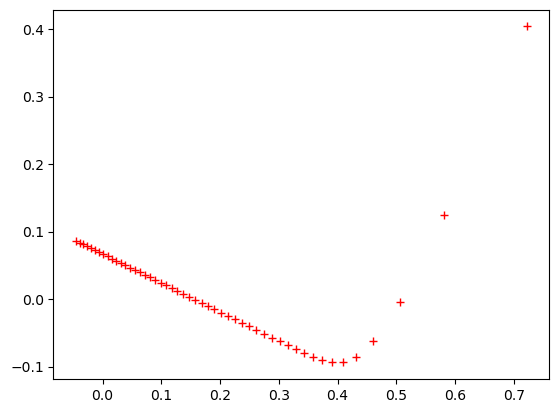

In [60]:
#getting a visual of the same loss function where X-theta0, y-theta1, z-loss with the line the loss function takes towards the min
#X-Theta0
#Y-Theta1
#Z-Loss
#black line-path of loss function over the iterations.
line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#adding a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [61]:
#Reruning the optimization above, but this time starting closer to the objective

num_iterations=50 #starting with the same number of itereations
theta_init=np.array([[-0.1],[0.1]]) #making a guess that is more accurate to the min
alpha= 0.1 #staring with the same step size
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,Y, theta_init,
                                                                   alpha, num_iterations)

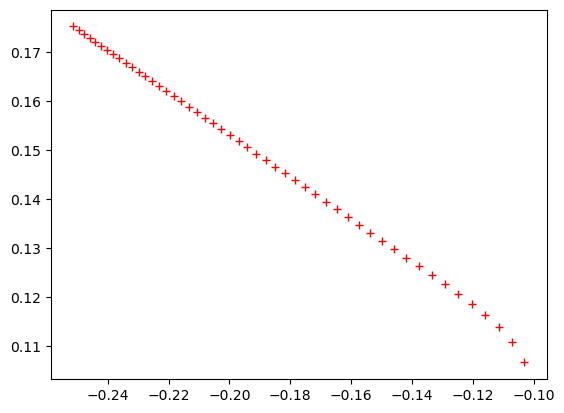

In [62]:
#looking at the new loss path on the function
line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#adding a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

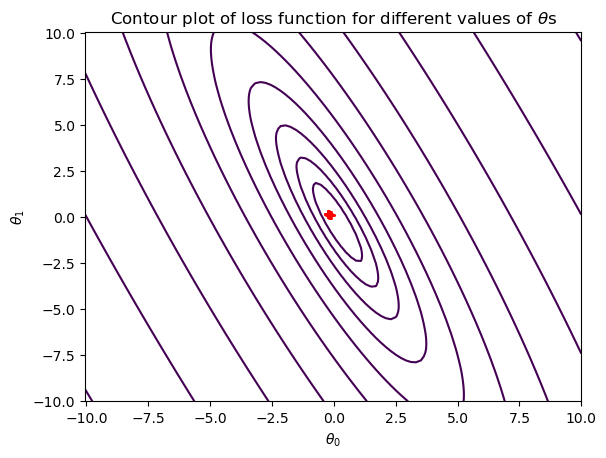

In [64]:
#showing the convergence similar to above, but without height
plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,35))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s");
plt.plot(theta0_history1, theta1_history1, 'r+');

# Valentia 1999

In [67]:
# translating chosen weather data into the X and Y datasets needed for the optimization function.
X=index.to_numpy().reshape(rows,1)
#Representing x_0 as a vector of 1s for vector computation
ones=np.ones((rows,1))
X=np.concatenate((ones, X), axis=1)
Y=data_year["VALENTIA_temp_mean"].to_numpy().reshape(rows,1)
X.shape, Y.shape

((365, 2), (365, 1))

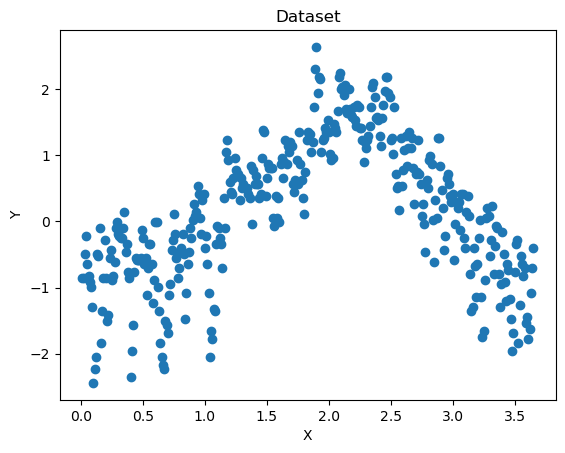

In [68]:
#looking at one year of temperature data over time for BUDAPEST
plt.scatter(x=index["index"], y=data_year["VALENTIA_temp_mean"]) 
plt.xlabel("X"); plt.ylabel("Y");
plt.title("Dataset");
plt.show()

In [69]:
#finding the min temp for VALENTIA station for 1999
data_year["VALENTIA_temp_mean"].min()

-2.4407027041939955

In [70]:
data_year["VALENTIA_temp_mean"].max()

2.63642315379047

In [71]:
%%time
#running the data through a gradiant descent for the starting conditions in 'theta_init.'
num_iterations=50 # per your suggestion starting at 50 iterations
theta_init=np.array([[1],[1]]) #guessing theta0 and theta1 at 1 and 1
alpha=0.1 #step size to try if not converged will try smaller stepps
theta, J_history, theta0_history, theta1_history = gradient_descent(X,Y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 93.8 ms
Wall time: 99.5 ms


In [72]:
theta

array([[0.02043152],
       [0.11064867]])

C:\Users\Sam\AppData\Local\Temp\ipykernel_46640\294946337.py:24: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



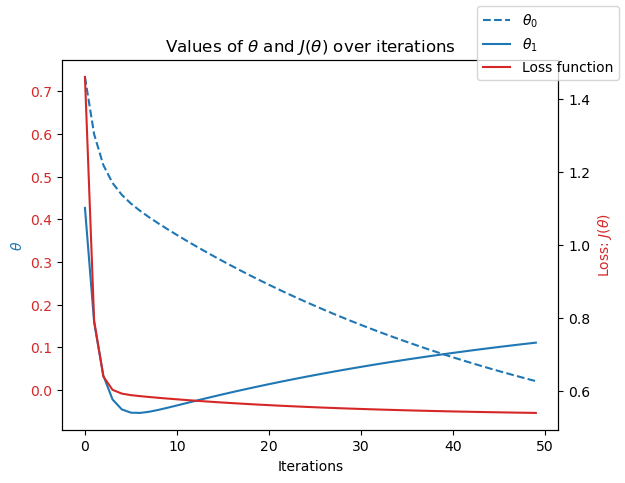

In [73]:
#making sure the plot gets displayed in the notebook
%matplotlib inline
#plotting the loss, theta0, and theta1. Red should be trnding towards 0
fig, ax1 = plt.subplots()

# plotting thetas over time
color="tab:blue"
ax1.plot(theta0_history, label="$\\theta_{0}$", linestyle="--", color=color)
ax1.plot(theta1_history, label="$\\theta_{1}$", linestyle="-", color=color)
# ax1.legend()
ax1.set_xlabel("Iterations"); ax1.set_ylabel("$\\theta$", color=color);
ax1.tick_params(axis="y", labelcolor=color)

# plotting loss function over time
color="tab:red"
ax2 = ax1.twinx()
ax2.plot(J_history, label="Loss function", color=color)
ax2.set_title("Values of $\\theta$ and $J(\\theta)$ over iterations")
ax2.set_ylabel("Loss: $J(\\theta)$", color=color)
ax1.tick_params(axis="y", labelcolor=color)

# ax2.legend();
fig.legend();
fig.show()

In [76]:
%%time
# theta ranges based on where thetas apperaed above
theta0_vals = np.linspace(-10.02043152,10,100) 
theta1_vals = np.linspace(-10,10.11064867,100) 
                                      
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

#computing cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, Y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitializing to 0

CPU times: total: 1.91 s
Wall time: 2.36 s


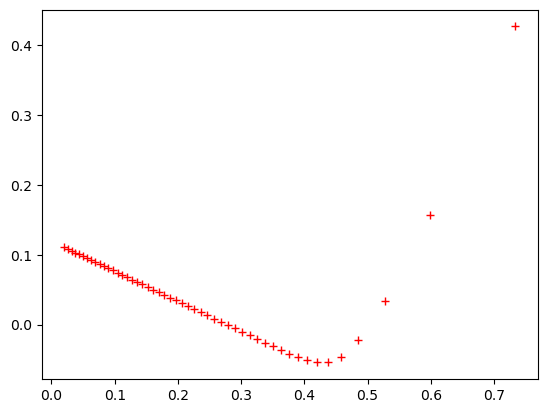

In [77]:
#getting a visual of the same loss function where X-theta0, y-theta1, z-loss with the line the loss function takes towards the min
#X-Theta0
#Y-Theta1
#Z-Loss
#black line-path of loss function over the iterations.
line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#adding a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [78]:
#Reruning the optimization above, but this time starting closer to the objective

num_iterations=50 #starting with the same number of itereations
theta_init=np.array([[-0.2],[0.2]]) #making a guess that is more accurate to the min
alpha= 0.1 #staring with the same step size
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,Y, theta_init,
                                                                   alpha, num_iterations)

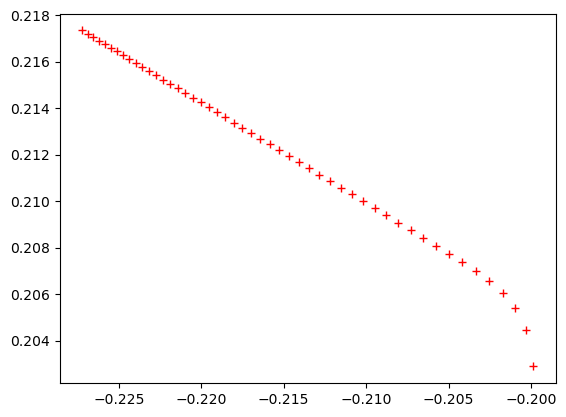

In [79]:
#looking at the new loss path on the function
line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#adding a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

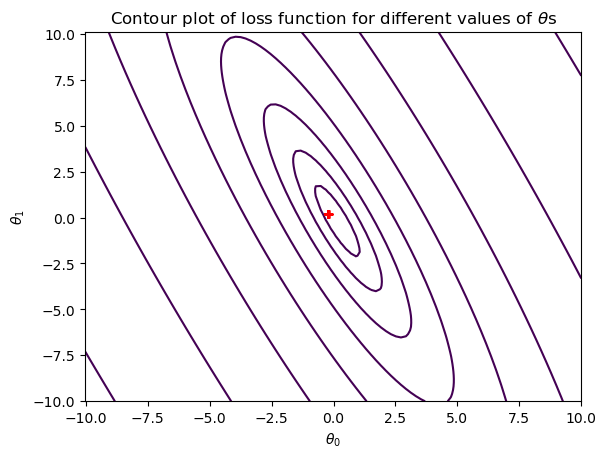

In [81]:
#showing the convergence similar to above, but without height
plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,28))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s");
plt.plot(theta0_history1, theta1_history1, 'r+');

# ROMA 1996

In [82]:
# reducing to year 1996
data_year_1996=data_reduced[data_reduced["DATE"].astype(str).str.contains("1996")]

In [83]:
#checking for execution
data_year_1996

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
13149,19960101,1,-1.194075,-1.255208,-1.322668,-1.807335,-1.357599,-2.679605,-1.294515,-1.585724,-1.443478,-1.237316,-0.610866,-1.447075,-1.521409,-0.758466,-0.621584,-1.747095,-0.382822,-0.337751
13150,19960102,1,-1.275559,-1.266557,-1.263851,-1.918090,-1.504866,-2.091341,-1.119803,-1.733389,-1.310279,-1.432356,-0.786094,-1.447075,-2.298039,-0.724789,-0.826335,-2.282040,-0.696575,-0.367793
13151,19960103,1,-1.275559,-1.618381,-1.710860,-1.791512,-1.431233,-1.439135,-1.084860,-1.777689,-1.322388,-1.477365,-0.786094,-1.447075,-2.407253,-0.910009,-1.089587,-2.095431,-1.261329,0.203008
13152,19960104,1,-1.261978,-1.663777,-1.581463,-1.506712,-1.549046,-1.426347,-1.014975,-2.191152,-1.588786,-1.537377,-0.637824,-1.509912,-2.395118,-1.398318,-1.440589,-1.971026,-1.261329,-0.397835
13153,19960105,1,-1.411366,-1.879411,-1.534409,-1.696579,-1.652132,-1.605384,-0.805320,-2.191152,-1.734094,-1.657402,-0.691740,-2.100579,-2.443657,-1.634053,-1.162712,-2.505971,-0.916201,-0.457920
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13510,19961227,12,-2.524979,-2.435519,-2.416664,-2.361113,-2.462097,-2.717970,-1.871067,-2.678447,-2.460634,-2.377548,-1.460049,-2.766650,-0.817587,-2.593830,-2.844598,-1.013101,-2.641841,-1.689649
13511,19961228,12,-2.810173,-2.526313,-2.522535,-2.946535,-2.874442,-2.897007,-1.923481,-2.929478,-2.521179,-2.737621,-1.823984,-2.842054,-1.424330,-2.896918,-2.435095,-1.050423,-2.767342,-1.960028
13512,19961229,12,-3.054625,-2.412821,-2.393138,-2.266179,-2.476823,-2.359897,-1.888539,-2.914712,-2.557506,-2.557584,-1.743109,-2.942593,-0.853992,-1.718244,-2.259594,-1.149947,-3.112470,-2.500787
13513,19961230,12,-2.470657,-2.537662,-2.404901,-1.775690,-2.093931,-2.858642,-1.853596,-2.530782,-2.521179,-2.062484,-1.473528,-2.465033,-1.472869,-2.576992,-2.244969,-1.535605,-2.532027,-2.560871


In [92]:
# creating an index for the year 1996, had 366 days, scaling by 100
i=np.arange(0.01,3.67,0.01) 
index = pd.DataFrame(data=i, columns=["index"])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [93]:
rows=data_year_1996.shape[0]

In [94]:
rows

366

In [95]:
# translating chosen weather data into the X and Y datasets needed for the optimization function.
X=index.to_numpy().reshape(rows,1)
#Representing x_0 as a vector of 1s for vector computation
ones=np.ones((rows,1))
X=np.concatenate((ones, X), axis=1)
Y=data_year_1996["ROMA_temp_mean"].to_numpy().reshape(rows,1)

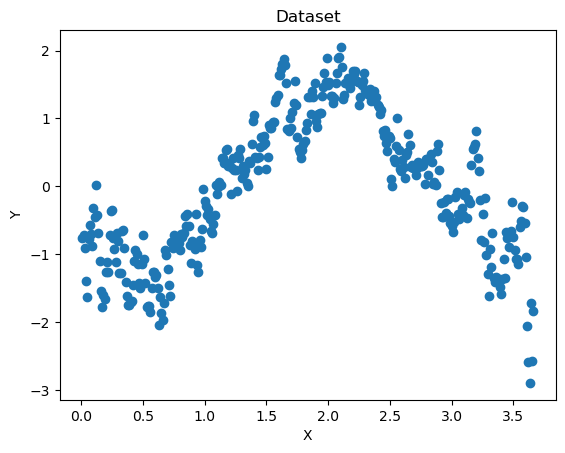

In [97]:
#looking at one year of temperature data over time for BUDAPEST
plt.scatter(x=index["index"], y=data_year_1996["ROMA_temp_mean"]) 
plt.xlabel("X"); plt.ylabel("Y");
plt.title("Dataset");
plt.show()

In [98]:
#finding the min temp for VALENTIA station for 1999
data_year_1996["ROMA_temp_mean"].min()

-2.8969182618623694

In [99]:
#finding the max temp for VALENTIA station for 1999
data_year_1996["ROMA_temp_mean"].max()

2.0535154406224394

In [100]:
%%time
#running the data through a gradiant descent for the starting conditions in 'theta_init.'
num_iterations=50 # per your suggestion starting at 50 iterations
theta_init=np.array([[1],[1]]) #guessing theta0 and theta1 at 1 and 1
alpha=0.1 #step size to try if not converged will try smaller stepps
theta, J_history, theta0_history, theta1_history = gradient_descent(X,Y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 62.5 ms
Wall time: 56.6 ms


In [101]:
theta

array([[-0.10915546],
       [ 0.07935005]])

C:\Users\Sam\AppData\Local\Temp\ipykernel_46640\294946337.py:24: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



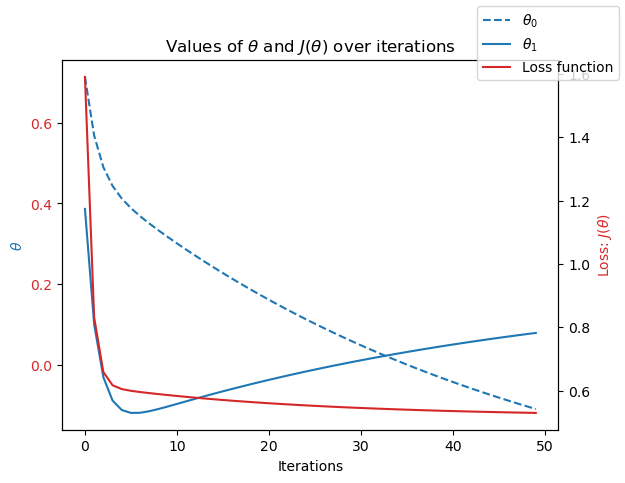

In [102]:
#making sure the plot gets displayed in the notebook
%matplotlib inline
#plotting the loss, theta0, and theta1. Red should be trnding towards 0
fig, ax1 = plt.subplots()

# plotting thetas over time
color="tab:blue"
ax1.plot(theta0_history, label="$\\theta_{0}$", linestyle="--", color=color)
ax1.plot(theta1_history, label="$\\theta_{1}$", linestyle="-", color=color)
# ax1.legend()
ax1.set_xlabel("Iterations"); ax1.set_ylabel("$\\theta$", color=color);
ax1.tick_params(axis="y", labelcolor=color)

# plotting loss function over time
color="tab:red"
ax2 = ax1.twinx()
ax2.plot(J_history, label="Loss function", color=color)
ax2.set_title("Values of $\\theta$ and $J(\\theta)$ over iterations")
ax2.set_ylabel("Loss: $J(\\theta)$", color=color)
ax1.tick_params(axis="y", labelcolor=color)

# ax2.legend();
fig.legend();
fig.show()

In [103]:
%%time
# theta ranges based on where thetas apperaed above
theta0_vals = np.linspace(-10.10915546,10,100) 
theta1_vals = np.linspace(-10,10.07935005,100) 
                                      
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

#computing cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, Y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitializing to 0

CPU times: total: 2.3 s
Wall time: 2.3 s


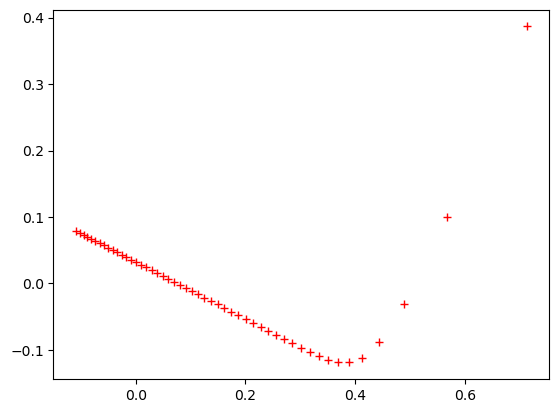

In [104]:
#getting a visual of the loss function where X-theta0, y-theta1, z-loss with the line the loss function takes towards the min
#X-Theta0
#Y-Theta1
#Z-Loss
#black line-path of loss function over the iterations.
line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#adding a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [105]:
#Reruning the optimization above, but this time starting closer to the objective

num_iterations=50 #starting with the same number of itereations
theta_init=np.array([[-0.2],[0.2]]) #making a guess that is more accurate to the min
alpha= 0.1 #staring with the same step size
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,Y, theta_init,
                                                                   alpha, num_iterations)

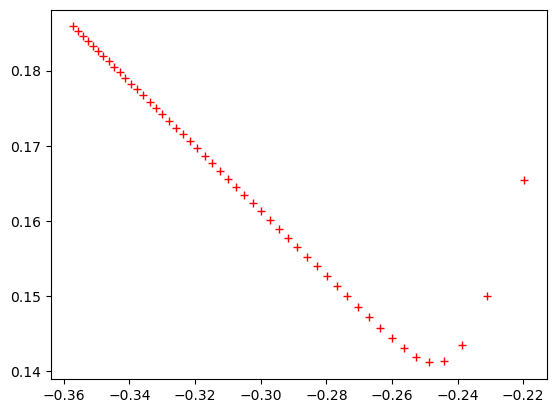

In [106]:
#looking at the new loss path on the function
line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#adding a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

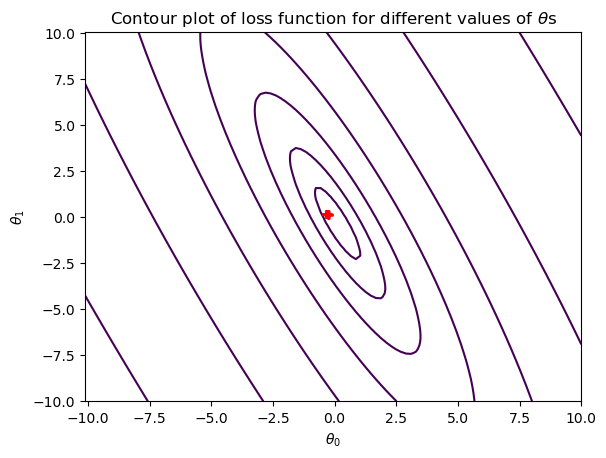

In [107]:
#showing the convergence similar to above, but without height
plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,25))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s");
plt.plot(theta0_history1, theta1_history1, 'r+');

# MADRID 1970

In [109]:
# reducing to year 1970
data_year_1970=data_reduced[data_reduced["DATE"].astype(str).str.contains("1970")]

In [110]:
#checking for execution
data_year_1970

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
3653,19700101,1,-1.900269,-1.380049,-1.416775,-3.088935,-2.889169,-3.357388,-1.923481,-2.678447,-1.455587,-2.842642,-1.392653,-1.798962,-1.254442,-1.179421,-1.528340,-1.660011,-2.139837,-2.260450
3654,19700102,1,-1.968172,-1.629730,-1.581463,-1.490890,-1.666859,-1.809997,-1.626469,-1.895821,-1.673549,-1.792429,-1.810505,-1.685856,-1.654892,-1.566700,-1.791591,-1.535605,-1.857459,-1.809817
3655,19700103,1,-1.710140,-1.300605,-1.934365,-1.617468,-1.475413,-1.451923,-1.643941,-1.526658,-1.431369,-1.387347,-1.500486,-1.283700,-1.909724,-1.246774,-1.221213,-1.971026,-1.747646,-1.599522
3656,19700104,1,-1.520011,-0.926083,-1.734387,-2.171246,-2.079204,-1.541442,-2.272906,-1.940121,-1.043881,-1.987469,-0.637824,-1.459643,-2.358713,-1.027877,-1.060337,-2.070550,-2.030023,-2.650998
3657,19700105,1,-1.112591,-0.449419,-1.052110,-1.981379,-1.902485,-1.464712,-2.430148,-1.733389,-1.019663,-1.852441,-0.732178,-1.283700,-2.492197,-0.253319,-0.621584,-2.854307,-1.998648,-2.560871
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4013,19701227,12,-2.348431,-1.221161,-2.204923,-2.598446,-2.491550,-1.490288,-2.133136,-2.205918,-1.782530,-2.422557,-2.107045,-2.377061,-1.072419,-0.758466,-1.367464,-1.324116,-2.579090,-3.011504
4014,19701228,12,-2.063237,-0.744497,-1.216797,-2.044668,-1.902485,-1.298463,-1.906010,-1.689090,-1.649331,-2.152502,-1.864421,-1.899501,-0.999610,-0.674275,-1.074962,-1.174829,-2.406526,-2.500787
4015,19701229,12,-1.968172,-0.267832,-1.287378,-2.013024,-1.902485,-1.196156,-1.678883,-1.733389,-1.358715,-2.047481,-2.012691,-1.635586,-1.400060,-0.371187,-1.118837,-1.261913,-2.375151,-2.620956
4016,19701230,12,-1.669398,-0.256483,-0.934476,-1.981379,-2.108658,-1.068273,-1.661412,-1.792455,-0.971227,-2.137499,-2.053129,-1.597884,-1.485004,-0.674275,-0.855585,-1.759536,-2.233962,-2.200365


In [111]:
# creating an index for the year 1970, had 365 days, scaling by 100
i=np.arange(0.01,3.66,0.01) 
index = pd.DataFrame(data=i, columns=["index"])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [112]:
rows=data_year_1970.shape[0]

In [113]:
rows

365

In [115]:
# translating chosen weather data into the X and Y datasets needed for the optimization function.
X=index.to_numpy().reshape(rows,1)
#Representing x_0 as a vector of 1s for vector computation
ones=np.ones((rows,1))
X=np.concatenate((ones, X), axis=1)
Y=data_year_1970["MADRID_temp_mean"].to_numpy().reshape(rows,1)

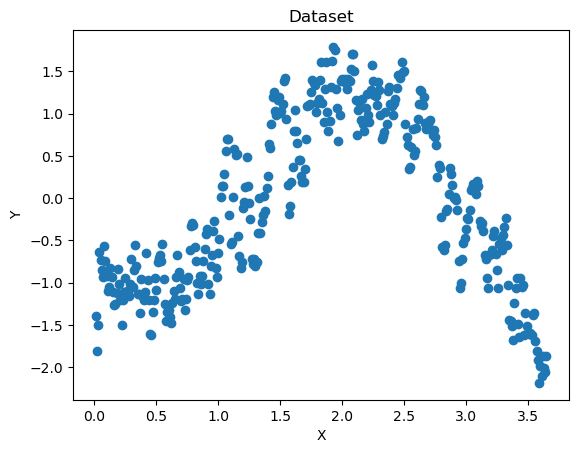

In [117]:
#looking at one year of temperature data over time for BUDAPEST
plt.scatter(x=index["index"], y=data_year_1970["MADRID_temp_mean"]) 
plt.xlabel("X"); plt.ylabel("Y");
plt.title("Dataset");
plt.show()

In [118]:
#finding the min temp for MADRID station for 1970
data_year_1970["MADRID_temp_mean"].min()

-2.187919416904836

In [119]:
#finding the max temp for MARDID station for 1970
data_year_1970["MADRID_temp_mean"].max()

1.7884121125055297

In [120]:
%%time
#running the data through a gradiant descent for the starting conditions in 'theta_init.'
num_iterations=50 # per your suggestion starting at 50 iterations
theta_init=np.array([[1],[1]]) #guessing theta0 and theta1 at 1 and 1
alpha=0.1 #step size to try if not converged will try smaller stepps
theta, J_history, theta0_history, theta1_history = gradient_descent(X,Y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 46.9 ms
Wall time: 47.5 ms


In [121]:
theta

array([[-0.08454471],
       [ 0.03342464]])

C:\Users\Sam\AppData\Local\Temp\ipykernel_46640\294946337.py:24: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



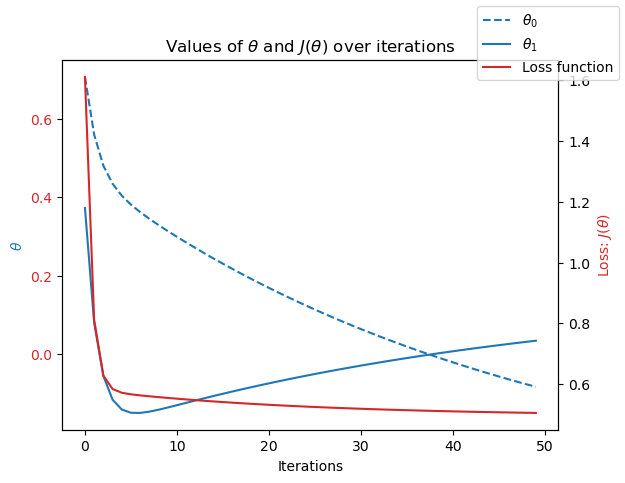

In [122]:
#making sure the plot gets displayed in the notebook
%matplotlib inline
#plotting the loss, theta0, and theta1. Red should be trnding towards 0
fig, ax1 = plt.subplots()

# plotting thetas over time
color="tab:blue"
ax1.plot(theta0_history, label="$\\theta_{0}$", linestyle="--", color=color)
ax1.plot(theta1_history, label="$\\theta_{1}$", linestyle="-", color=color)
# ax1.legend()
ax1.set_xlabel("Iterations"); ax1.set_ylabel("$\\theta$", color=color);
ax1.tick_params(axis="y", labelcolor=color)

# plotting loss function over time
color="tab:red"
ax2 = ax1.twinx()
ax2.plot(J_history, label="Loss function", color=color)
ax2.set_title("Values of $\\theta$ and $J(\\theta)$ over iterations")
ax2.set_ylabel("Loss: $J(\\theta)$", color=color)
ax1.tick_params(axis="y", labelcolor=color)

# ax2.legend();
fig.legend();
fig.show()

In [123]:
%%time
# theta ranges based on where thetas apperaed above
theta0_vals = np.linspace(-10.08454471,10,100) 
theta1_vals = np.linspace(-10,10.03342464,100) 
                                      
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

#computing cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, Y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitializing to 0

CPU times: total: 2.19 s
Wall time: 2.18 s


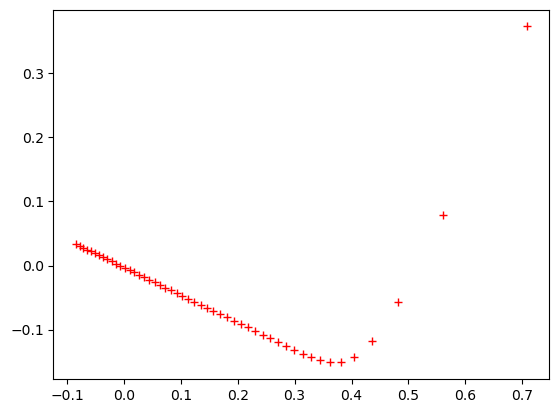

In [124]:
#getting a visual of the loss function where X-theta0, y-theta1, z-loss with the line the loss function takes towards the min
#X-Theta0
#Y-Theta1
#Z-Loss
#black line-path of loss function over the iterations.
line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#adding a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [125]:
#Reruning the optimization above, but this time starting closer to the objective

num_iterations=50 #starting with the same number of itereations
theta_init=np.array([[-0.2],[0.2]]) #making a guess that is more accurate to the min
alpha= 0.1 #staring with the same step size
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,Y, theta_init,
                                                                   alpha, num_iterations)

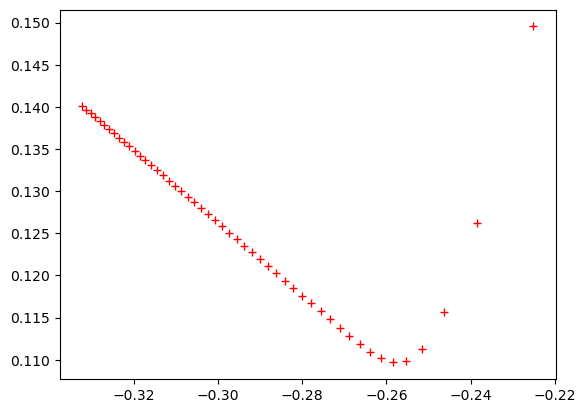

In [126]:
#looking at the new loss path on the function
line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#adding a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

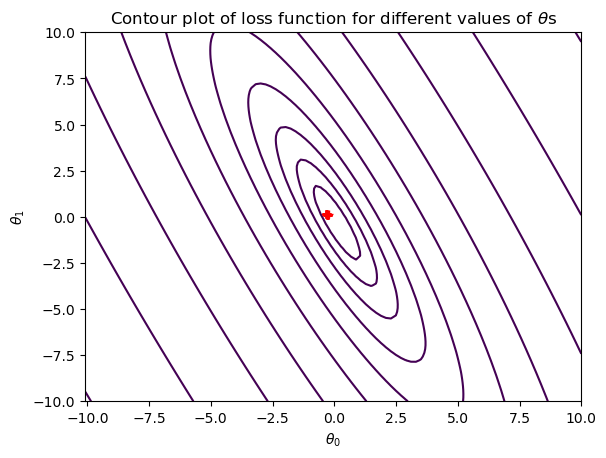

In [127]:
#showing the convergence similar to above, but without height
plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,35))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s");
plt.plot(theta0_history1, theta1_history1, 'r+');